In this case we have done all the task 4 questions. In Task 4 question 2, we have chosen 900 pixels to be missing randomly from the image, and the results are accordingly.

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


In [2]:
device

device(type='cpu')

In [3]:
#!wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg
img= torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


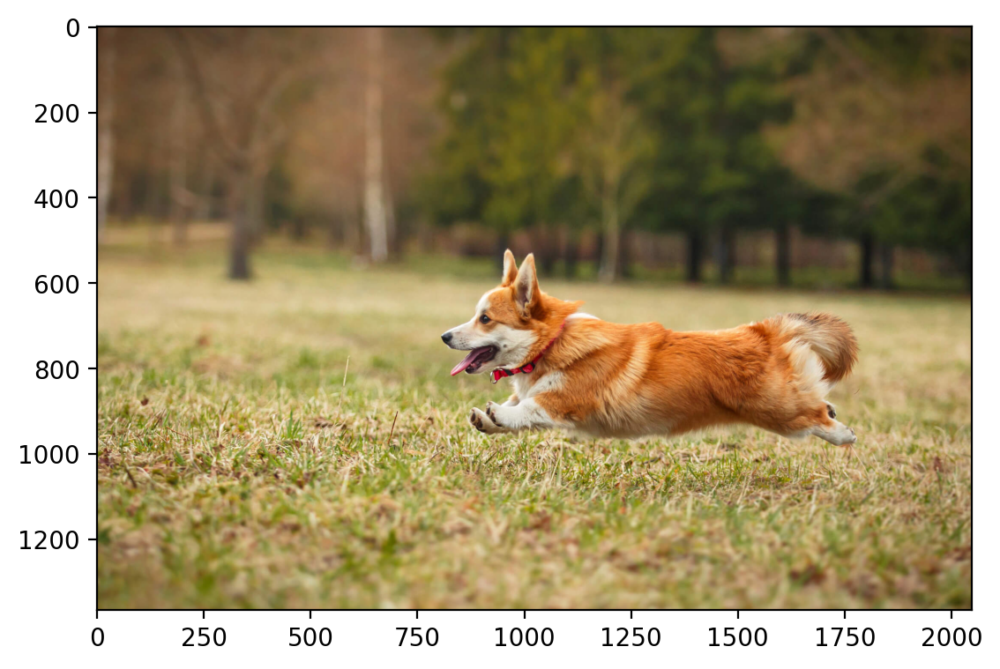

In [4]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [5]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [7]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)

nan_count = torch.isnan(img_scaled).sum().item()

print(f"Number of NaN values in cropped image: {nan_count}") #To confirm that initially there are no Nan values

Number of NaN values in cropped image: 0


In [8]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [10]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop1 = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop_masked = crop
crop.shape
print(crop)

nan_count = torch.isnan(crop).sum().item()

print(f"Number of NaN values before masking: {nan_count}")

tensor([[[0.7686, 0.7686, 0.7686,  ..., 0.5451, 0.5451, 0.5412],
         [0.7725, 0.7725, 0.7725,  ..., 0.5686, 0.5686, 0.5647],
         [0.7765, 0.7765, 0.7765,  ..., 0.5882, 0.5843, 0.5843],
         ...,
         [0.7961, 0.7373, 0.7176,  ..., 0.5843, 0.5725, 0.5490],
         [0.8471, 0.7843, 0.7451,  ..., 0.6039, 0.5686, 0.5569],
         [0.8784, 0.8196, 0.7686,  ..., 0.6275, 0.5804, 0.5686]],

        [[0.6941, 0.6941, 0.6941,  ..., 0.5137, 0.5137, 0.5098],
         [0.6980, 0.6980, 0.6980,  ..., 0.5255, 0.5255, 0.5216],
         [0.7020, 0.7020, 0.7020,  ..., 0.5451, 0.5412, 0.5412],
         ...,
         [0.7686, 0.7098, 0.6863,  ..., 0.2824, 0.2706, 0.2431],
         [0.8157, 0.7569, 0.7137,  ..., 0.3059, 0.2667, 0.2431],
         [0.8431, 0.7882, 0.7333,  ..., 0.3294, 0.2706, 0.2588]],

        [[0.4745, 0.4745, 0.4745,  ..., 0.3294, 0.3294, 0.3255],
         [0.4784, 0.4784, 0.4784,  ..., 0.3451, 0.3451, 0.3412],
         [0.4824, 0.4824, 0.4824,  ..., 0.3647, 0.3608, 0.

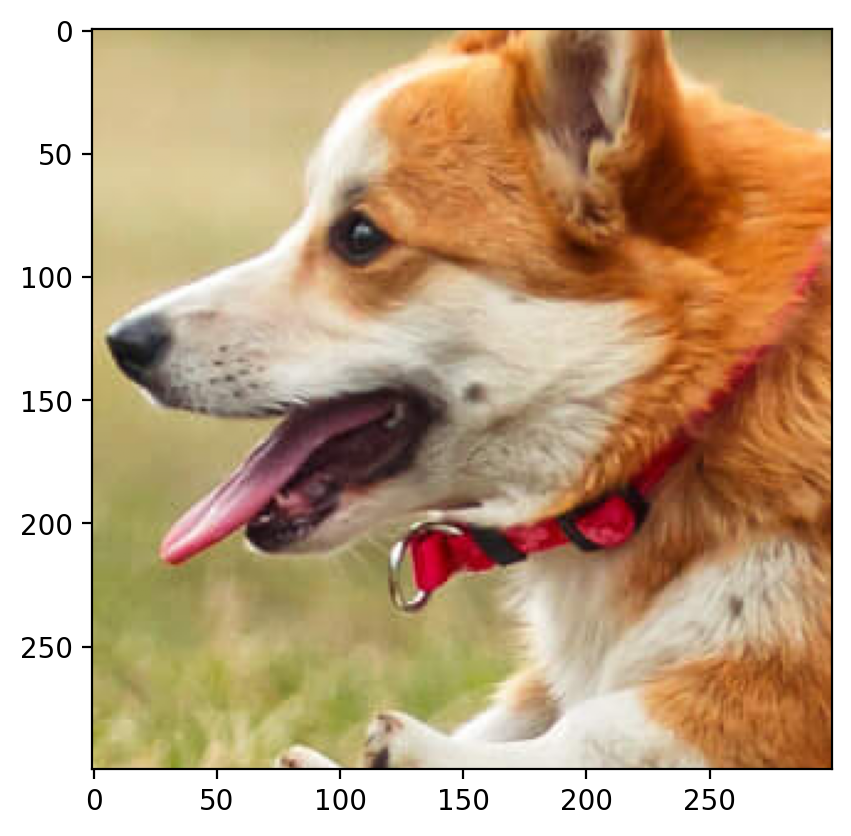

In [11]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [12]:
# Modify the loss function to ignore NaN values

def factorize(A, k, device=torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    A = A.to(device)
    # Randomly initialize A and B
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    # Train the model
    for i in range(1000):
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)

        # Zero the gradients
        optimizer.zero_grad()

        # Backpropagate
        loss.backward()

        # Update the parameters
        optimizer.step()

    return W, H, loss

In [13]:
from sklearn.metrics import mean_squared_error

def plot(original_image, k_values=[5, 10, 25, 50], device='cpu'):
    fig, axs = plt.subplots(1, 1 + len(k_values), figsize=(20, 4))
    axs[0].imshow(rearrange(original_image, 'c h w -> h w c').detach().numpy())
    #original_image = original_image.to(device)
    #original_img_np = original_image.cpu().detach().numpy()
    #axs[0].imshow(original_img_np, cmap='gray')
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    matrixr = original_image[0, :, :]
    matrixg = original_image[1, :, :]
    matrixb = original_image[2, :, :]

    for i, k in enumerate(k_values):
        Wr, Hr, lossr = factorize(matrixr, k, device=device)
        Wg, Hg, lossg = factorize(matrixg, k, device=device)
        Wb, Hb, lossb = factorize(matrixb, k, device=device)

        reconstructed_img = torch.stack([torch.mm(Wr,Hr), torch.mm(Wg,Hg), torch.mm(Wb,Hb)], dim=0)

        original_flat = original_image.reshape(-1)
        reconstructed_flat = reconstructed_img.reshape(-1)

        # Compute the RMSE
        #mse = torch.mean((original_flat - reconstructed_flat) ** 2)  # Mean Squared Error
        mask = ~torch.isnan(reconstructed_flat) & ~torch.isnan(original_flat)
        mse = torch.mean((reconstructed_flat[mask] - original_flat[mask]) ** 2)
        rmse = torch.sqrt(mse)
        rmse = torch.sqrt(mse)  # Root Mean Squared Error
        #rmse = np.sqrt(mean_squared_error(original_image.cpu().detach().numpy(), reconstructed_img.cpu().detach().numpy()))
        psnr = 20 * np.log10(1 / rmse.cpu().detach().numpy())
        if rmse == 0:
            psnr = float('inf')
        #reconstructed_img_np = reconstructed_img.cpu().detach().numpy()
        axs[i + 1].imshow(rearrange(reconstructed_img, 'c h w -> h w c').detach().numpy())
        #axs[i + 1].set_title(f'k={k}, Loss={loss.item():.4f}, RMSE={rmse:.4f}, \n PSNR={psnr:.4f}')
        axs[i + 1].set_title(f'k={k}, Rmse={rmse:.4f}, \n PSNR={psnr:.4f}')
        axs[i + 1].axis('off')

    plt.suptitle('Original and Reconstructed Images for Different k Values')
    plt.tight_layout()
    plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


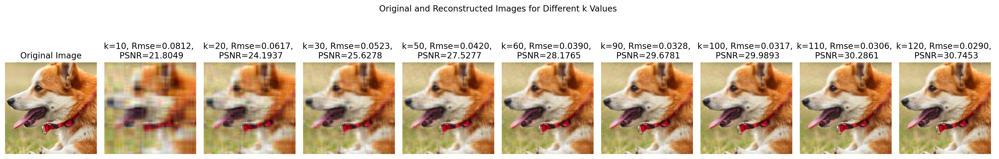

In [14]:
plot(crop, [10,20,30,50,60,90,100,110,120])

From here it is evident that the RMSE has almost saturated around 90, after which there is not a huge change in RMSE values, thus we choose r=80 and r=90 as two ranks for matrix factorization

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


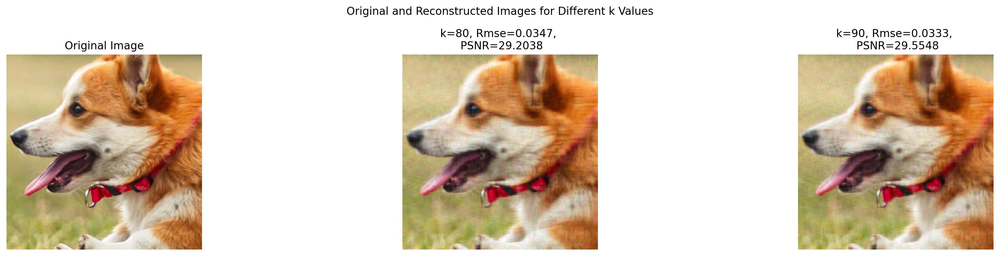

In [16]:
plot(crop, [80,90])

In [17]:
import random
# Randomly select 900 unique pixel locations (y, x coordinates)
random_indices = np.random.choice(90000, size=900, replace=False)

# Convert 1D indices to 2D coordinates
y_coords, x_coords = np.unravel_index(random_indices, (300, 300))

# Set selected pixel values to NaN across all channels
for y, x in zip(y_coords, x_coords):
    crop_masked[:, y, x] = float('nan')
nan_count = torch.isnan(crop_masked).sum().item()
print(f"Number of NaN values after masking: {nan_count}")

Number of NaN values after masking: 2700


2700 NaN values, as 900 pixels have missing R,G,B values, thus a total of 900*3=2700 NaN values

In [14]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [15]:
img_X, img_Y = create_coordinate_map(crop_masked)
#img_X_random, img_Y_random =create_coordinate_map(crop_masked_random)

print(img_X.shape)
print(img_Y.shape)

nan_count = torch.isnan(img_Y).sum().item()

print(f"Number of NaN values in masked image: {nan_count}")

torch.Size([90000, 2])
torch.Size([90000, 3])
Number of NaN values: 2700


In [16]:
# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(img_X.cpu())
scaler_X_random = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(img_X.cpu())

# Scale the X coordinates
img_X_scaled = scaler_X.transform(img_X.cpu())


# Move the scaled X coordinates to the GPU
img_X_scaled = torch.tensor(img_X_scaled).to(device)

# Set to dtype float32
img_X_scaled = img_X_scaled.float()

In [17]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)

net = LinearModel(2, 3)
net.to(device)

LinearModel(
  (linear): Linear(in_features=2, out_features=3, bias=True)
)

In [18]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3) with some NaN values
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)

    # Create a mask to ignore NaN values in Y
    mask = ~torch.isnan(Y)

    for epoch in range(epochs):
        optimizer.zero_grad()

        # Get model predictions
        outputs = net(X)

        # Mask the outputs and Y to exclude NaN values
        masked_outputs = outputs[mask]
        masked_Y = Y[mask]

        # Compute the loss only for valid (non-NaN) values
        loss = criterion(masked_outputs, masked_Y)

        # Backpropagation and optimizer step
        loss.backward()
        optimizer.step()

        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")

    return loss.item()

In [19]:
# create RFF features
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

In [20]:
X_rff = create_rff_features(img_X_scaled, 20000, 0.008)
X_rff.shape

torch.Size([90000, 20000])

In [22]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)
train(net, 0.005, X_rff, img_Y, 2500)

Epoch 0 loss: 0.370844
Epoch 100 loss: 0.052217
Epoch 200 loss: 0.014499
Epoch 300 loss: 0.009097
Epoch 400 loss: 0.006729
Epoch 500 loss: 0.005200
Epoch 600 loss: 0.004125
Epoch 700 loss: 0.003339
Epoch 800 loss: 0.002747
Epoch 900 loss: 0.002291
Epoch 1000 loss: 0.001931
Epoch 1100 loss: 0.001643
Epoch 1200 loss: 0.001407
Epoch 1300 loss: 0.001214
Epoch 1400 loss: 0.001053
Epoch 1500 loss: 0.000920
Epoch 1600 loss: 0.000810
Epoch 1700 loss: 0.000718
Epoch 1800 loss: 0.000643
Epoch 1900 loss: 0.000582
Epoch 2000 loss: 0.000533
Epoch 2100 loss: 0.000493
Epoch 2200 loss: 0.000462
Epoch 2300 loss: 0.000437
Epoch 2400 loss: 0.000418


0.0004024987865705043

In [38]:
def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        predicted = img_Y.cpu().numpy()
        original = outputs.cpu().numpy()
        rmse = np.sqrt(np.nanmean((predicted - original) ** 2))
        print(rmse)
        psnr = 20 * np.log10(1 / rmse)
        if rmse == 0:
           psnr = float('inf')
        outputs = outputs.reshape(height, width, num_channels)
        #outputs = outputs.permute(1, 2, 0)
    fig = plt.figure(figsize=(7, 6))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax1.imshow(outputs.cpu())
    ax1.set_title(f"Reconstructed Image\nRMSE: {rmse:.4f} ,PSNR: {psnr:.4f} dB")

    ax0.imshow(original_img.cpu().permute(1, 2, 0))
    ax0.set_title("Original Image With Missing Values")

    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

0.020059044


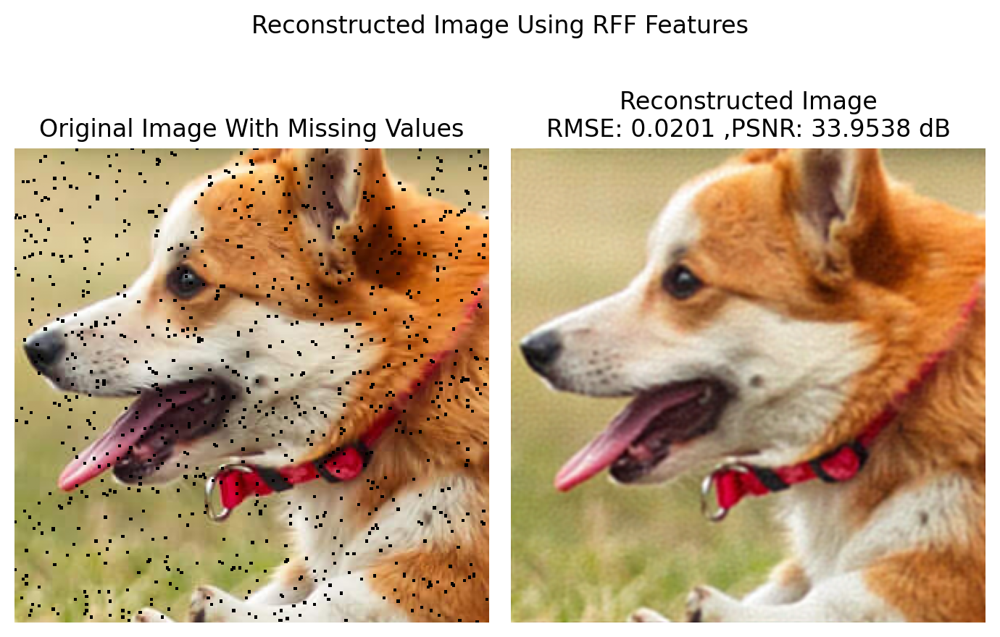

In [39]:
plot_reconstructed_and_original_image(crop_masked, net, X_rff, title="Reconstructed Image Using RFF Features")

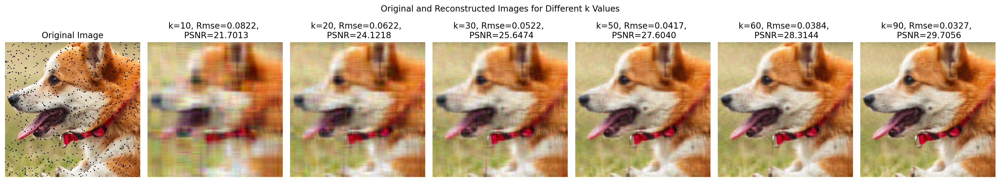

In [27]:
plot(crop_masked, [10,20,30,50,60,90])